In [3]:
import csv
import os

import biosppy.signals.ecg as ecg
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import tree
from sklearn.model_selection import train_test_split

In [4]:
labels = pd.read_csv('public/y_train.csv', index_col='id')

In [5]:
# Retrieve one sample recording per class for plotting
labels_array = labels['y'].to_numpy()
num_classes = 4
sample_signal_ids = []
for class_id in range(num_classes):
    sample_signal_ids.append(int(np.argwhere(labels_array == class_id)[0]))
    
# Print indices of the sample signals
sample_signal_ids

[0, 3, 4, 30]

In [6]:
data = pd.read_csv('public/X_train.csv', index_col='id')

In [7]:
data.shape

(5117, 17807)

In [8]:
# Show the data
data

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x17797,x17798,x17799,x17800,x17801,x17802,x17803,x17804,x17805,x17806
id,,,,,,,,,,,,,,,,,,,,,
0,-13,-9,-6,-4,0,2,6,12,23,35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-34,110,249,390,527,639,721,777,823,845,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-34,-36,-37,-39,-41,-42,-44,-46,-48,-51,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,292,298,303,310,320,336,354,377,405,419,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,157,179,195,210,217,222,226,228,231,233,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5112,-247,-271,-285,-303,-334,-376,-413,-432,-443,-451,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5113,62,62,61,61,61,61,61,61,61,62,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5114,-95,-110,-124,-131,-126,-114,-95,-67,-42,-23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Pay attention to NaN values! 

Unlike many medical application, these NaNs **DO NOT** represent missing values but appear because of variable length of the signals. ECG recordings normally don't have missing values and are sampled equally.

Despite being put into a tabular CSV format / Pandas Dataframe, the data is still a raw signal with variable lengths. Coumns *x0, ..., x17806* correspond to measurements at time stamps *0, ..., 17806* and not to different features of the data point. If the signal is too short then all the coumns after the last measurement have NaN values,

In [9]:
# Get the raw recording without Nan values as a NumPy array
data.loc[0].dropna().to_numpy(dtype='float32')

array([-13.,  -9.,  -6., ...,  60.,  74.,  91.], dtype=float32)

## Plot sample signals for each class

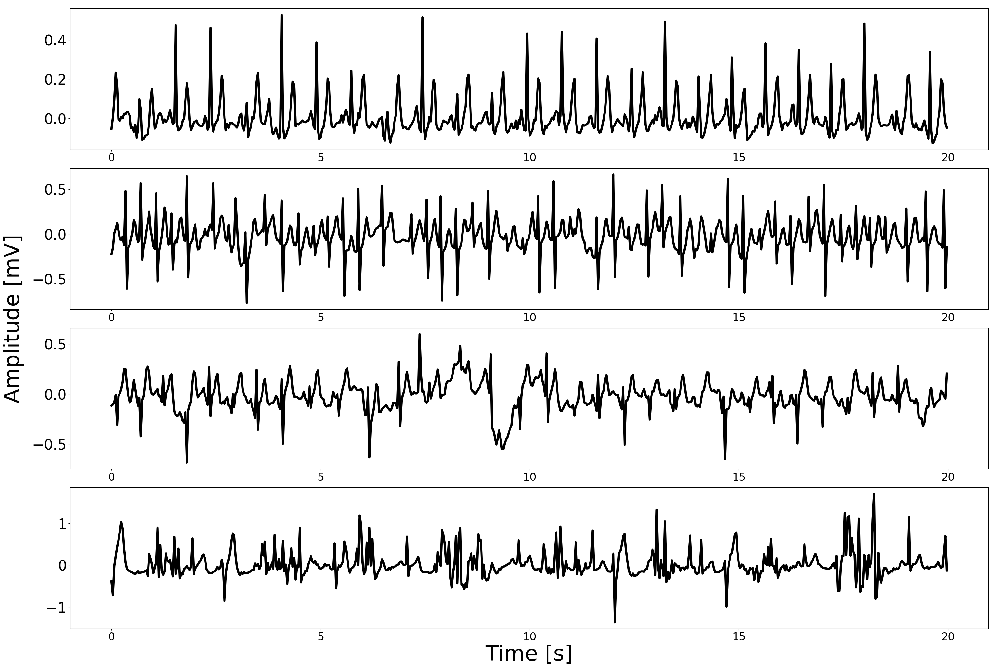

In [10]:
# Some matplotlib setting 
plt.rcParams["figure.figsize"] = (30, 20)
plt.rcParams['lines.linewidth'] = 5
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 32
plt.rcParams['axes.labelsize'] = 48
plt.rcParams['axes.titlesize'] = 48

fig, axs = plt.subplots(4, 1)

seconds = np.arange(0, 600) / 30 
x_labels = [0, 5, 10, 15, 20]

for class_id in range(num_classes):
    ax = axs[class_id]
    #ax.set_title("Class {}".format(class_id))
    
    measurements = data.loc[sample_signal_ids[class_id]].dropna().to_numpy(dtype='float32')
    # Get a subsequence of a signal and downsample it for visualization purposes
    measurements = measurements[1000:7000:10] 
    # convert volts to millivolts
    measurements /= 1000
    ax.plot(seconds, measurements, color='k')
    ax.set_xticks(x_labels)
          
fig.tight_layout()

# Display x- and y-labels for the whole plot
ax = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax.yaxis.set_label_coords(-0.05, 0.5)
plt.xlabel('Time [s]')
plt.ylabel('Amplitude [mV]')            
plt.show()

In [11]:
def plot_features(signal):
    r_peaks = ecg.engzee_segmenter(signal, 300)['rpeaks']
    #print(r_peaks)
    if len(r_peaks) >= 2:
        #print(ecg.extract_heartbeats(signal, r_peaks, 300))
        beats = ecg.extract_heartbeats(signal, r_peaks, 300)['templates']

        if len(beats) != 0:
            mu = np.mean(beats, axis=0) 
            var = np.std(beats, axis=0)
            md = np.median(beats, axis=0)
            
            plt.plot(range(mu.shape[0]), mu, label='Average HeartBeat')
            # Fill the variance range
            plt.fill_between(range(mu.shape[0]), mu - var, mu + var, linewidth=0, alpha=0.1)
            # Plot a median
            plt.plot(range(md.shape[0]), md, 'k', label='Median HeartBeat', color='#CC4F1B')

/var/folders/rg/xgkyjs4945d6ckms1nn6v0jm0000gn/T/ipykernel_1249/2348902154.py:17: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(range(md.shape[0]), md, 'k', label='Median HeartBeat', color='#CC4F1B')


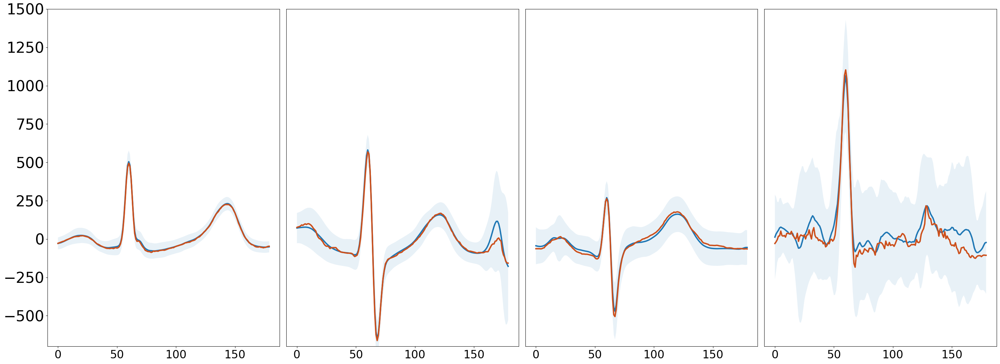

In [12]:
plt.rcParams['lines.linewidth'] = 3
plt.figure(figsize=(30, 11))
for class_id in range(num_classes):
    ax = plt.subplot(1, 4, class_id + 1)
    #ax.set_title("Class {}".format(class_id))
    ax.set_ylim([-700, 1500])
    if class_id:
        ax.set_yticks([])
    plot_features(data.loc[sample_signal_ids[class_id]].dropna().to_numpy(dtype='float32'))

plt.tight_layout()
plt.show()

In [13]:
for id, row in data.iterrows():
    print(row)

x0       -13.0
x1        -9.0
x2        -6.0
x3        -4.0
x4         0.0
          ... 
x17802     NaN
x17803     NaN
x17804     NaN
x17805     NaN
x17806     NaN
Name: 0, Length: 17807, dtype: float64
x0        -34.0
x1        110.0
x2        249.0
x3        390.0
x4        527.0
          ...  
x17802      NaN
x17803      NaN
x17804      NaN
x17805      NaN
x17806      NaN
Name: 1, Length: 17807, dtype: float64
x0       -34.0
x1       -36.0
x2       -37.0
x3       -39.0
x4       -41.0
          ... 
x17802     NaN
x17803     NaN
x17804     NaN
x17805     NaN
x17806     NaN
Name: 2, Length: 17807, dtype: float64
x0        292.0
x1        298.0
x2        303.0
x3        310.0
x4        320.0
          ...  
x17802      NaN
x17803      NaN
x17804      NaN
x17805      NaN
x17806      NaN
Name: 3, Length: 17807, dtype: float64
x0        157.0
x1        179.0
x2        195.0
x3        210.0
x4        217.0
          ...  
x17802      NaN
x17803      NaN
x17804      NaN
x17805      NaN
x1

In [14]:
def retrieve_features_per_sample(signal) -> dict:
    r_peaks = ecg.engzee_segmenter(signal, 300)['rpeaks']
    #print(r_peaks)
    print(r_peaks)
    if len(r_peaks) >= 2:
        #print(ecg.extract_heartbeats(signal, r_peaks, 300))
        beats = ecg.extract_heartbeats(signal, r_peaks, 300)['templates']
        print(beats)

        if len(beats) != 0:
            mu = np.mean(beats, axis=0) 
            var = np.std(beats, axis=0)
            md = np.median(beats, axis=0)
            
            return {"mu":mu,"var":var,"md":md}

def retrieve_features() -> dict:
    return {sample_id:retrieve_features_per_sample(sample.dropna().to_numpy(dtype='float32')) for sample_id, sample in data.iterrows()}



In [15]:
pre_features = retrieve_features()

[  199   448   695   948  1204  1459  1711  1966  2220  2471  2723  2976
  3229  3476  3726  3981  4231  4478  4726  4971  5213  5453  5692  5929
  6163  6399  6635  6872  7105  7332  7560  7795  8035  8277  8519  8767
  9014  9265  9514  9762 10013 10261 10509 10755 11006 11257 11507 11756
 12005 12255 12505 12757 13010 13257 13504 13754 14006 14259 14509 14760
 15012 15263 15512 15762 16011 16256]
[[ -4.  -7.  -6. ... -88. -88. -89.]
 [ 16.  21.  26. ... -40. -39. -37.]
 [-42. -37. -31. ... -26. -23. -20.]
 ...
 [-58. -57. -57. ... -21. -20. -19.]
 [-19. -16. -13. ... -71. -70. -68.]
 [-41. -41. -41. ... -65. -72. -78.]]
[  14  194  438  680  916 1139 1366 1638 1807 2017 2225 2438 2658 2892
 3118 3347 3585 3833 4080 4320 4571 4820 5061 5289 5525 5765 6015 6253
 6483 6721 6968 7222 7466 7705 7956 8213 8472]
[[ 604.  605.  605. ...  -81.  -92. -119.]
 [-138. -125. -117. ... -124. -101.  -81.]
 [ -19.  -15.  -11. ...  -35.  -26.   -9.]
 ...
 [-174. -177. -179. ...  -66.  -50.  -40.]
 [ 

In [16]:
pre_features

{0: {'mu': array([-2.85538464e+01, -2.66000004e+01, -2.45384617e+01, -2.19692307e+01,
         -1.87999992e+01, -1.54923077e+01, -1.17076921e+01, -7.75384617e+00,
         -3.87692308e+00, -3.07692319e-01,  3.20000005e+00,  7.03076935e+00,
          1.08000002e+01,  1.42153845e+01,  1.67999992e+01,  1.91076927e+01,
          2.10461540e+01,  2.24615383e+01,  2.30615387e+01,  2.35538464e+01,
          2.36307697e+01,  2.30923080e+01,  2.20461540e+01,  2.06769238e+01,
          1.88461533e+01,  1.63384609e+01,  1.29846153e+01,  8.63076878e+00,
          3.75384617e+00, -2.33846164e+00, -9.72307682e+00, -1.74615383e+01,
         -2.47384624e+01, -3.13384609e+01, -3.69692307e+01, -4.15999985e+01,
         -4.53384628e+01, -4.80769234e+01, -5.07384605e+01, -5.27999992e+01,
         -5.45999985e+01, -5.60000000e+01, -5.66923065e+01, -5.67999992e+01,
         -5.60615387e+01, -5.50615387e+01, -5.41538467e+01, -5.31230774e+01,
         -5.21692314e+01, -5.07999992e+01, -4.92153854e+01, -4.6430

In [17]:
def flatten_features(features_samples:dict) -> dict:
    """For each sample only one instance of each feature

    Args:
        features_samples (dict)

    Returns:
        dict: only one instance of each feature per sample
    """
    ft = features_samples.copy()
    keys_to_remove = []
    for key in ft.keys():
        if ft[key]:
            ft[key]["mu"] = np.nanmean(ft[key]["mu"])
            ft[key]["var"] = np.nanmean(ft[key]["var"])
            ft[key]["md"] = np.nanmean(ft[key]["md"])
        else:
            keys_to_remove.append(key)
    for key in keys_to_remove:
        del ft[key]
    return ft
            

features = flatten_features(pre_features)

In [18]:
features

{0: {'mu': 24.376411, 'var': 47.036034, 'md': 21.083334},
 1: {'mu': 15.634129, 'var': 105.42369, 'md': 13.438889},
 2: {'mu': 47.38537, 'var': 127.18164, 'md': 31.866667},
 3: {'mu': -14.339373, 'var': 116.13353, 'md': -22.083334},
 4: {'mu': -21.131945, 'var': 111.04379, 'md': -20.191668},
 5: {'mu': 14.158888, 'var': 29.976389, 'md': 13.705556},
 6: {'mu': 29.245419, 'var': 43.0264, 'md': 27.372223},
 7: {'mu': -6.021578, 'var': 84.23844, 'md': -11.466666},
 8: {'mu': 25.777401, 'var': 33.489067, 'md': 28.027779},
 9: {'mu': 45.3899, 'var': 161.5388, 'md': 1.0055555},
 10: {'mu': 46.26859, 'var': 15.96697, 'md': 47.566666},
 11: {'mu': -24.76344, 'var': 126.59827, 'md': -5.038889},
 12: {'mu': 25.405111, 'var': 29.869938, 'md': 24.01111},
 13: {'mu': 59.63979, 'var': 120.507484, 'md': 62.488888},
 14: {'mu': 8.160043, 'var': 118.384125, 'md': 13.313889},
 15: {'mu': 32.673653, 'var': 219.6987, 'md': 8.9777775},
 16: {'mu': -4.0929008, 'var': 22.162998, 'md': -5.5583334},
 17: {'mu':

In [19]:
features_df = pd.DataFrame.from_dict(features, orient="index")

In [20]:
list(features_df.index)

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [21]:
def adjust_X_y(X,y):
    y = y[y.index.isin(X.index)]
    return X, y

X, y = adjust_X_y(features_df, labels)

In [22]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state=109) # 70% training and 30% test

In [77]:
x_train.index

Int64Index([ 625, 1662, 1429, 1239, 4905, 2450, 1930, 4336, 2330, 4598,
            ...
            1304,  564,  298,  319, 3896, 2648, 2457,  141, 3336, 3353],
           dtype='int64', length=3811)

In [76]:
y_train.index

Int64Index([ 625, 1662, 1429, 1239, 4905, 2450, 1930, 4336, 2330, 4598,
            ...
            1304,  564,  298,  319, 3896, 2648, 2457,  141, 3336, 3353],
           dtype='int64', name='id', length=3811)

In [79]:
concatenated = pd.concat([x_train, y_train])

In [71]:
import sklearn
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

clf = make_pipeline(SVC(C=1, kernel="rbf"))
clf.fit(x_train, y_train)

/opt/anaconda3/envs/aml/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(steps=[('svc', SVC(C=1))])

In [72]:
sklearn.metrics.f1_score(y_test, clf.predict(x_test), average=None)

array([0.73826174, 0.        , 0.        , 0.2       ])

In [73]:
sklearn.metrics.f1_score(y_test, clf.predict(x_test), average="micro")

0.5861526357199056

In [59]:
y_train["y"].value_counts()

0    2272
2    1099
1     323
3     117
Name: y, dtype: int64